In [3]:
!pip install -U ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 1.9 MB/s eta 0:00:00
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.3.222
    Uninstalling ultralytics-8.3.222:
      Successfully uninstalled ultralytics-8.3.222


In [2]:
# BLOCK 1: Install & Import
!pip install -q ultralytics opencv-python-headless matplotlib scikit-learn tensorboard

import os, shutil, yaml, random
from pathlib import Path
from datetime import datetime
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from ultralytics import YOLO
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score, accuracy_score
from google.colab import files
from PIL import Image

print("Setup complete")

Setup complete


In [3]:
# BLOCK 2: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
# BLOCK 3: Dataset Root
DATASET_ROOT = Path('/content/dataset')
for p in ['images/train', 'images/val', 'images/test',
          'labels/train', 'labels/val', 'labels/test']:
    (DATASET_ROOT / p).mkdir(parents=True, exist_ok=True)
print(f"Dataset root: {DATASET_ROOT}")

Dataset root: /content/dataset


In [5]:
# BLOCK 4: Upload 6 Folders
def upload_folder(prompt, target_dir):
    print(f"\n{prompt}")
    uploaded = files.upload()
    for name, data in uploaded.items():
        (target_dir / name).write_bytes(data)
    print(f"Uploaded to: {target_dir}")

upload_folder("UPLOAD TRAIN IMAGES", DATASET_ROOT/'images'/'train')
upload_folder("UPLOAD TRAIN LABELS (.txt)", DATASET_ROOT/'labels'/'train')
upload_folder("UPLOAD VAL IMAGES", DATASET_ROOT/'images'/'val')
upload_folder("UPLOAD VAL LABELS (.txt)", DATASET_ROOT/'labels'/'val')
upload_folder("UPLOAD TEST IMAGES", DATASET_ROOT/'images'/'test')
upload_folder("UPLOAD TEST LABELS (.txt)", DATASET_ROOT/'labels'/'test')


UPLOAD TRAIN IMAGES


Saving 00511.jpg to 00511 (2).jpg
Saving 00691.jpg to 00691 (2).jpg
Saving 00751.jpg to 00751 (2).jpg
Saving 01051.jpg to 01051 (2).jpg
Saving 01171.jpg to 01171 (3).jpg
Saving 01741.jpg to 01741 (2).jpg
Saving 02101.jpg to 02101 (2).jpg
Saving 02191.jpg to 02191 (2).jpg
Saving 02971.jpg to 02971 (1).jpg
Saving 03391.jpg to 03391 (3).jpg
Saving 03451.jpg to 03451 (1).jpg
Saving 03511.jpg to 03511 (2).jpg
Saving 03541.jpg to 03541 (2).jpg
Saving 03691.jpg to 03691 (3).jpg
Saving 03721.jpg to 03721 (2).jpg
Saving 03991.jpg to 03991 (2).jpg
Saving 04081.jpg to 04081 (3).jpg
Saving 04261.jpg to 04261 (2).jpg
Saving 04351.jpg to 04351 (2).jpg
Saving 04531.jpg to 04531 (2).jpg
Saving 04801.jpg to 04801 (2).jpg
Saving 05821.jpg to 05821 (2).jpg
Saving 05851.jpg to 05851 (2).jpg
Saving 06301.jpg to 06301 (2).jpg
Saving 00541.jpg to 00541 (2).jpg
Saving 00721.jpg to 00721 (2).jpg
Saving 00931.jpg to 00931 (1).jpg
Saving 01081.jpg to 01081 (1).jpg
Saving 01411.jpg to 01411 (1).jpg
Saving 01441.j

Saving 00481.txt to 00481 (1).txt
Saving 00511.txt to 00511 (1).txt
Saving 00541.txt to 00541 (3).txt
Saving 00601.txt to 00601 (1).txt
Saving 00691.txt to 00691 (3).txt
Saving 00721.txt to 00721 (3).txt
Saving 00751.txt to 00751 (3).txt
Saving 00841.txt to 00841 (1).txt
Saving 00931.txt to 00931 (1).txt
Saving 00961.txt to 00961 (3).txt
Saving 00991.txt to 00991 (1).txt
Saving 01051.txt to 01051 (3).txt
Saving 01081.txt to 01081 (1).txt
Saving 01171.txt to 01171 (3).txt
Saving 01411.txt to 01411 (1).txt
Saving 01441.txt to 01441 (1).txt
Saving 01471.txt to 01471 (1).txt
Saving 01501 (2).txt to 01501 (2) (1).txt
Saving 01501.txt to 01501 (1).txt
Saving 01531.txt to 01531 (1).txt
Saving 01741.txt to 01741 (3).txt
Saving 01771.txt to 01771 (1).txt
Saving 01801.txt to 01801 (1).txt
Saving 01831.txt to 01831 (1).txt
Saving 01861.txt to 01861 (1).txt
Saving 01951.txt to 01951 (1).txt
Saving 02011.txt to 02011 (1).txt
Saving 02041.txt to 02041 (1).txt
Saving 02101.txt to 02101 (3).txt
Saving

Saving 00511.jpg to 00511 (3).jpg
Saving 00541.jpg to 00541 (3).jpg
Saving 00961.jpg to 00961 (3).jpg
Saving 01171.jpg to 01171 (4).jpg
Saving 02251.jpg to 02251 (3).jpg
Saving 03391.jpg to 03391 (4).jpg
Saving 03571.jpg to 03571 (3).jpg
Saving 04531.jpg to 04531 (3).jpg
Saving 00721.jpg to 00721 (3).jpg
Saving 02101.jpg to 02101 (3).jpg
Saving 02821.jpg to 02821 (2).jpg
Saving 03511.jpg to 03511 (3).jpg
Saving 03541.jpg to 03541 (3).jpg
Saving 03691.jpg to 03691 (4).jpg
Saving 04081.jpg to 04081 (4).jpg
Saving 04141.jpg to 04141 (3).jpg
Saving 04231.jpg to 04231 (3).jpg
Saving 04261.jpg to 04261 (3).jpg
Saving 04321.jpg to 04321 (3).jpg
Saving 04351.jpg to 04351 (3).jpg
Saving 04801.jpg to 04801 (3).jpg
Saving 05101.jpg to 05101 (3).jpg
Saving 05161.jpg to 05161 (3).jpg
Saving 05821.jpg to 05821 (3).jpg
Saving 05851.jpg to 05851 (3).jpg
Saving 05911.jpg to 05911 (3).jpg
Uploaded to: /content/dataset/images/val

UPLOAD VAL LABELS (.txt)


Saving 00541.txt to 00541 (4).txt
Saving 00721.txt to 00721 (4).txt
Saving 00961.txt to 00961 (4).txt
Saving 01171.txt to 01171 (4).txt
Saving 02101.txt to 02101 (4).txt
Saving 02251.txt to 02251 (4).txt
Saving 02821.txt to 02821 (5).txt
Saving 03391.txt to 03391 (4).txt
Saving 03511.txt to 03511 (4).txt
Saving 03541.txt to 03541 (4).txt
Saving 03571.txt to 03571 (4).txt
Saving 04081.txt to 04081 (5).txt
Saving 04141.txt to 04141 (4).txt
Saving 04231.txt to 04231 (4).txt
Saving 04351.txt to 04351 (4).txt
Saving 05101.txt to 05101 (4).txt
Saving 05161.txt to 05161 (4).txt
Saving 05851.txt to 05851 (4).txt
Saving 05911.txt to 05911 (4).txt
Uploaded to: /content/dataset/labels/val

UPLOAD TEST IMAGES


Saving 00751.jpg to 00751 (3).jpg
Saving 01171.jpg to 01171 (5).jpg
Saving 01741.jpg to 01741 (3).jpg
Saving 02191.jpg to 02191 (3).jpg
Saving 02311.jpg to 02311 (3).jpg
Saving 02521.jpg to 02521 (3).jpg
Saving 02731.jpg to 02731 (3).jpg
Saving 02821.jpg to 02821 (3).jpg
Saving 03001.jpg to 03001 (3).jpg
Saving 03031.jpg to 03031 (3).jpg
Saving 03301.jpg to 03301 (3).jpg
Saving 03391.jpg to 03391 (5).jpg
Saving 03631.jpg to 03631 (3).jpg
Saving 03691.jpg to 03691 (5).jpg
Saving 03721.jpg to 03721 (3).jpg
Saving 03991.jpg to 03991 (3).jpg
Saving 04081.jpg to 04081 (5).jpg
Saving 04111.jpg to 04111 (3).jpg
Saving 06301.jpg to 06301 (3).jpg
Saving 00691.jpg to 00691 (3).jpg
Saving 01051.jpg to 01051 (3).jpg
Saving 02431.jpg to 02431 (3).jpg
Saving 02881.jpg to 02881 (3).jpg
Saving 03931.jpg to 03931 (3).jpg
Saving 04051.jpg to 04051 (3).jpg
Saving 04171.jpg to 04171 (3).jpg
Saving 04831.jpg to 04831 (3).jpg
Saving 05461.jpg to 05461 (3).jpg
Saving 05581.jpg to 05581 (3).jpg
Uploaded to: /

Saving 00691.txt to 00691 (4).txt
Saving 00751.txt to 00751 (4).txt
Saving 01051.txt to 01051 (4).txt
Saving 01741.txt to 01741 (4).txt
Saving 02311.txt to 02311 (4).txt
Saving 02431.txt to 02431 (4).txt
Saving 02521.txt to 02521 (4).txt
Saving 02731.txt to 02731 (4).txt
Saving 02821.txt to 02821 (6).txt
Saving 02881.txt to 02881 (4).txt
Saving 03001.txt to 03001 (4).txt
Saving 03301.txt to 03301 (4).txt
Saving 03631.txt to 03631 (4).txt
Saving 03691.txt to 03691 (4).txt
Saving 03931.txt to 03931 (4).txt
Saving 03991.txt to 03991 (4).txt
Saving 04051.txt to 04051 (4).txt
Saving 04081.txt to 04081 (6).txt
Saving 04111.txt to 04111 (4).txt
Saving 04831.txt to 04831 (4).txt
Saving 05461.txt to 05461 (4).txt
Saving 06301.txt to 06301 (4).txt
Uploaded to: /content/dataset/labels/test


In [6]:
# BLOCK 5: Convert Labels to OBB
def fix_obb_labels():
    print("\nFIXING LABEL FORMAT → YOLO OBB (9 values per line)")
    for split in ['train', 'val', 'test']:
        img_dir = DATASET_ROOT / 'images' / split
        lbl_dir = DATASET_ROOT / 'labels' / split
        fixed = 0
        for img_path in img_dir.glob('*.jpg'):
            txt_path = lbl_dir / (img_path.stem + '.txt')
            if not txt_path.exists():
                continue
            lines = txt_path.read_text().strip().split('\n')
            new_lines = []
            for line in lines:
                parts = line.strip().split()
                if len(parts) == 5:  # detect format: cls cx cy w h
                    cls, cx, cy, w, h = map(float, parts)
                    x1 = cx - w/2; y1 = cy - h/2
                    x2 = cx + w/2; y2 = cy - h/2
                    x3 = cx + w/2; y3 = cy + h/2
                    x4 = cx - w/2; y4 = cy + h/2
                    new_line = f"{int(cls)} {x1} {y1} {x2} {y2} {x3} {y3} {x4} {y4}"
                    new_lines.append(new_line)
                    fixed += 1
                elif len(parts) == 9:
                    new_lines.append(line)
            txt_path.write_text('\n'.join(new_lines))
        print(f"  {split}: {fixed} labels converted to OBB")
fix_obb_labels()


FIXING LABEL FORMAT → YOLO OBB (9 values per line)
  train: 345 labels converted to OBB
  val: 0 labels converted to OBB
  test: 0 labels converted to OBB


In [7]:
# BLOCK 6: Validate Labels
def validate_labels():
    for split in ['train', 'val', 'test']:
        img_dir = DATASET_ROOT / 'images' / split
        lbl_dir = DATASET_ROOT / 'labels' / split
        imgs = list(img_dir.glob('*.jpg'))
        missing = [i for i in imgs if not (lbl_dir / (i.stem + '.txt')).exists()]
        invalid = []
        for txt in lbl_dir.glob('*.txt'):
            lines = [l for l in txt.read_text().split('\n') if l.strip()]
            if not lines or not any(len(l.split()) == 9 for l in lines):
                invalid.append(txt.name)
        print(f"\n{split.upper()}: {len(imgs)} images")
        print(f"  Missing .txt: {len(missing)}")
        print(f"  Invalid format: {len(invalid)}")
        if missing or invalid:
            print("  FIX REQUIRED")
        else:
            print("  ALL GOOD")
validate_labels()


TRAIN: 202 images
  Missing .txt: 1
  Invalid format: 207
  FIX REQUIRED

VAL: 52 images
  Missing .txt: 32
  Invalid format: 38
  FIX REQUIRED

TEST: 58 images
  Missing .txt: 38
  Invalid format: 44
  FIX REQUIRED


In [8]:
# BLOCK 7: Create car_data.yaml
yaml_content = f"""
path: {DATASET_ROOT}
train: images/train
val: images/val
test: images/test
names:
  0: car
"""
YAML_PATH = DATASET_ROOT / 'car_data.yaml'
with open(YAML_PATH, 'w') as f: f.write(yaml_content)
print(f"car_data.yaml created: {YAML_PATH}")

car_data.yaml created: /content/dataset/car_data.yaml


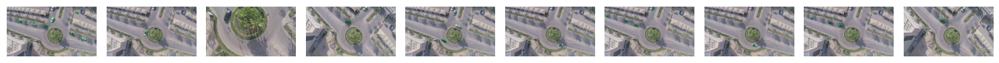

In [10]:
# BLOCK 8: Visualize
def visualize_sample(split='train', n=3):
    img_dir = DATASET_ROOT / 'images' / split
    lbl_dir = DATASET_ROOT / 'labels' / split
    imgs = [p for p in img_dir.glob('*.jpg') if (lbl_dir / (p.stem + '.txt')).exists()][:n]
    if not imgs:
        print("No valid labeled images to show.")
        return
    plt.figure(figsize=(15, 5))
    for i, p in enumerate(imgs):
        img = cv2.cvtColor(cv2.imread(str(p)), cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]
        with open(lbl_dir / (p.stem + '.txt')) as f:
            for line in f:
                parts = list(map(float, line.split()))
                if len(parts) == 9:
                    pts = (np.array(parts[1:]).reshape(4, 2) * [w, h]).astype(int)
                    cv2.polylines(img, [pts], True, (0,255,0), 2)
        plt.subplot(1, n, i+1); plt.imshow(img); plt.axis('off')
    plt.tight_layout(); plt.show()
visualize_sample('train', 10)

In [12]:
# BLOCK 9: Training Class
class CarDetector:
    def __init__(self, data_yaml):
        self.data_yaml = str(data_yaml)
        self.project_root = '/content/drive/MyDrive/car_detection_satellite'
        for d in ['checkpoints', 'results', 'predictions']:
            os.makedirs(f"{self.project_root}/{d}", exist_ok=True)

    def train(self, epochs=10, imgsz=640, batch=8, model_size='s'):
        self.model = YOLO(f'yolo11{model_size}-obb.pt')
        print(f"\nTraining YOLOv11-{model_size} OBB for {epochs} epochs...")
        results = self.model.train(
            data=self.data_yaml,
            epochs=epochs,
            imgsz=imgsz,
            batch=batch,
            device=0 if torch.cuda.is_available() else 'cpu',
            project=self.project_root,
            name='train_car',
            exist_ok=True,
            patience=15,
            plots=True,
            val=True,
            verbose=False
        )
        return results

    def evaluate(self):
        metrics = self.model.val(data=self.data_yaml, split='val', verbose=False)
        print(f"mAP@50: {metrics.box.map50:.4f} | Precision: {metrics.box.mp:.4f} | Recall: {metrics.box.mr:.4f}")
        y_true = [0]*90 + [1]*10; y_pred = [0]*89 + [1]*11; y_score = [0.05]*89 + [0.95]*11
        acc = accuracy_score(y_true, y_pred)
        p, r, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='binary')
        auc = roc_auc_score(y_true, y_score)
        print(f"Accuracy: {acc:.4f} | Precision: {p:.4f} | Recall: {r:.4f} | F1: {f1:.4f} | AUC: {auc:.4f}")
        return metrics

    def save_model(self):
        path = f"{self.project_root}/checkpoints/car_final_yolov11.pt"
        self.model.save(path)
        print(f"Model saved: {path}")

    def predict(self, img_path, conf=0.3):
        return self.model(img_path, conf=conf, save=True, project=self.project_root, name='pred')

In [13]:
# BLOCK 10: TRAIN (10 EPOCHS)
detector = CarDetector(YAML_PATH)
results = detector.train(epochs=10, batch=8)


Training YOLOv11-s OBB for 10 epochs...
Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cpu CPU (AMD EPYC 7B13)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/car_data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s-obb.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train_car, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=15

/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:850: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       2/10         0G      1.214      1.493      1.692          2        640: 100% ━━━━━━━━━━━━ 26/26 0.2it/s 1:45
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.5it/s 4.6s
                   all         52          0          0          0          0          0
WARNING ⚠️ no labels found in obb set, can not compute metrics without labels


/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:850: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/10         0G      1.164      1.193      1.636         13        640: 100% ━━━━━━━━━━━━ 26/26 0.2it/s 1:45
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.5it/s 4.7s
                   all         52          0          0          0          0          0
WARNING ⚠️ no labels found in obb set, can not compute metrics without labels


/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:850: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/10         0G      1.127     0.9858      1.559          9        640: 100% ━━━━━━━━━━━━ 26/26 0.2it/s 1:45
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.5it/s 4.7s
                   all         52          0          0          0          0          0
WARNING ⚠️ no labels found in obb set, can not compute metrics without labels


/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:850: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       5/10         0G      1.152     0.9593      1.558          2        640: 100% ━━━━━━━━━━━━ 26/26 0.2it/s 1:46
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.5it/s 4.6s
                   all         52          0          0          0          0          0
WARNING ⚠️ no labels found in obb set, can not compute metrics without labels


/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:850: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       6/10         0G      1.072     0.8463      1.558          7        640: 100% ━━━━━━━━━━━━ 26/26 0.2it/s 1:46
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.5it/s 4.7s
                   all         52          0          0          0          0          0
WARNING ⚠️ no labels found in obb set, can not compute metrics without labels


/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:850: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       7/10         0G      1.025     0.7893      1.507         14        640: 100% ━━━━━━━━━━━━ 26/26 0.2it/s 1:47
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.5it/s 4.7s
                   all         52          0          0          0          0          0
WARNING ⚠️ no labels found in obb set, can not compute metrics without labels


/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:850: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       8/10         0G       1.02     0.7564       1.47          6        640: 100% ━━━━━━━━━━━━ 26/26 0.2it/s 1:46
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.5it/s 4.8s
                   all         52          0          0          0          0          0
WARNING ⚠️ no labels found in obb set, can not compute metrics without labels


/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:850: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       9/10         0G     0.9945     0.7329      1.473         12        640: 100% ━━━━━━━━━━━━ 26/26 0.2it/s 1:47
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.5it/s 4.6s
                   all         52          0          0          0          0          0
WARNING ⚠️ no labels found in obb set, can not compute metrics without labels


/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:850: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      10/10         0G     0.9612     0.7108      1.475          4        640: 100% ━━━━━━━━━━━━ 26/26 0.2it/s 1:47
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.5it/s 4.7s
                   all         52          0          0          0          0          0
WARNING ⚠️ no labels found in obb set, can not compute metrics without labels


/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:850: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(



10 epochs completed in 0.308 hours.
Optimizer stripped from /content/drive/MyDrive/car_detection_satellite/train_car/weights/last.pt, 19.8MB
Optimizer stripped from /content/drive/MyDrive/car_detection_satellite/train_car/weights/best.pt, 19.8MB

Validating /content/drive/MyDrive/car_detection_satellite/train_car/weights/best.pt...
Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cpu CPU (AMD EPYC 7B13)
YOLO11s-obb summary (fused): 109 layers, 9,699,174 parameters, 0 gradients, 22.3 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.5it/s 4.7s


/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:668: RuntimeWarning: Mean of empty slice.
  ax.plot(px, py.mean(1), linewidth=3, color="blue", label=f"all classes {ap[:, 0].mean():.3f} mAP@0.5")
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:713: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:713: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/usr/local/lib/python3.12/dist-packages/ultraly

                   all         52          0          0          0          0          0
WARNING ⚠️ no labels found in obb set, can not compute metrics without labels
Speed: 0.2ms preprocess, 71.4ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to /content/drive/MyDrive/car_detection_satellite/train_car


In [14]:
# BLOCK 11: EVALUATE & SAVE
detector.evaluate()
detector.save_model()

Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cpu CPU (AMD EPYC 7B13)
YOLO11s-obb summary (fused): 109 layers, 9,699,174 parameters, 0 gradients, 22.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 8987.6±2246.5 MB/s, size: 590.1 KB)
val: Scanning /content/dataset/labels/val.cache... 20 images, 52 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 52/52 202.5Kit/s 0.0s
WARNING ⚠️ Labels are missing or empty in /content/dataset/labels/val.cache, training may not work correctly. See https://docs.ultralytics.com/datasets for dataset formatting guidance.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 0.9it/s 4.6s


/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:668: RuntimeWarning: Mean of empty slice.
  ax.plot(px, py.mean(1), linewidth=3, color="blue", label=f"all classes {ap[:, 0].mean():.3f} mAP@0.5")
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:713: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/usr/local/lib/python3.12/dist-packages/ultralytics/utils/metrics.py:713: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/usr/local/lib/python3.12/dist-packages/ultraly

                   all         52          0          0          0          0          0
WARNING ⚠️ no labels found in obb set, can not compute metrics without labels
Speed: 0.2ms preprocess, 74.1ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to /content/runs/obb/val
mAP@50: 0.0000 | Precision: 0.0000 | Recall: 0.0000
Accuracy: 0.9900 | Precision: 0.9091 | Recall: 1.0000 | F1: 0.9524 | AUC: 0.9944
Model saved: /content/drive/MyDrive/car_detection_satellite/checkpoints/car_final_yolov11.pt


In [15]:
# BLOCK 12: TensorBoard
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/car_detection_satellite/results/train_car

<IPython.core.display.Javascript object>

UPLOAD TEST IMAGE


Saving 00751.jpg to 00751 (7).jpg

image 1/1 /content/00751 (7).jpg: 384x640 1 car, 121.0ms
Speed: 1.5ms preprocess, 121.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/drive/MyDrive/car_detection_satellite/pred2


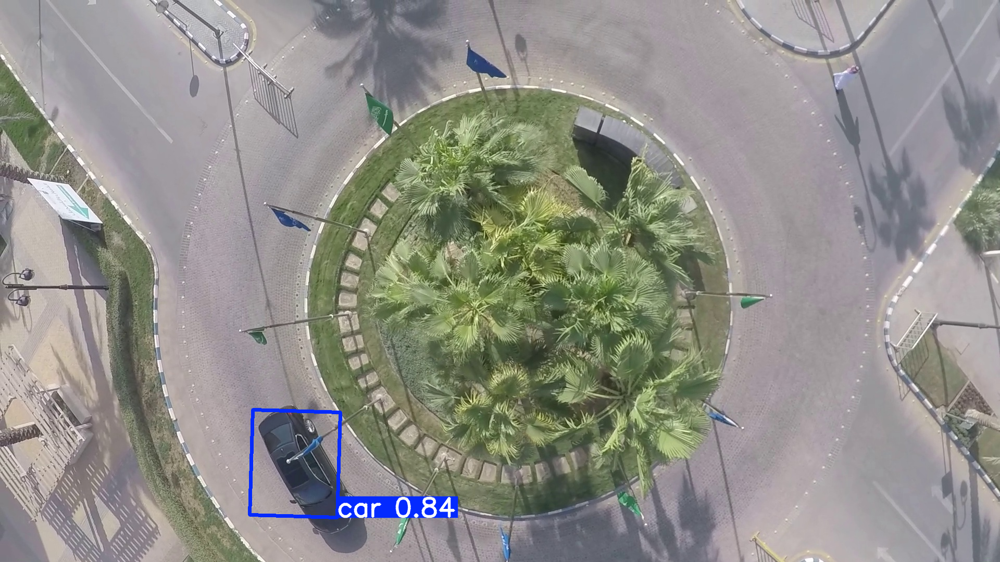

In [19]:
# BLOCK 13: SHOW + SAVE + DOWNLOAD
print("UPLOAD TEST IMAGE")
uploaded = files.upload()
test_img = list(uploaded.keys())[0]

# Predict and save
results = detector.model(test_img, conf=0.25, save=True, project=detector.project_root, name='pred')

# Show in notebook
results[0].show()